# Oxygen Budget Analysis 

This notebook analyzes the O$_2$ budget from POP output. Dissolved oxygen in the ocean's interior is simulated following:

$$
\frac{\partial{O_2}}{\partial{t}}= \underbrace{- \frac{\partial{U.O_2}}{\partial{x}} -\frac{\partial{V.O_2}}{\partial{y}}}_\text{Lateral Advection}
- \overbrace{\frac{\partial{W.O_2}}{\partial{z}}}^\text{Vertical Advection}
+ \underbrace{A_h.\nabla^2{O_2}}_\text{Lateral Mixing}
+\overbrace{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}^\text{Vertical Mixing}
+ \underbrace{ J(O_2)  }_\text{Sources - Sinks}
$$



In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import warnings
warnings.simplefilter("ignore") # Silence warnings

import xarray as xr
import numpy as np
from tqdm import tqdm
import xgcm 
import pop_tools

import matplotlib.pyplot as plt
import matplotlib.colors as colors
import cmocean
import cartopy
import cartopy.crs as ccrs
import proplot 
import matplotlib.patches as patches

from utils import *

In [2]:
C=CLSTR(1,20,200,10)

In [3]:
C

Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/yeddebba/proxy/40347/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/yeddebba/proxy/40347/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.12.206.46:33495,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/yeddebba/proxy/40347/status,Total threads: 0
Started: Just now,Total memory: 0 B


In [4]:
dsh=xr.open_mfdataset({'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/final_budget/O2_Budget_Mean.nc',
                      '/glade/scratch/yeddebba/Mesoscale/HR/TPAC/final_budget/O2_Budget_Eddy_Mean.nc',})
duh=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/HR/CLM/[UVW]VEL.CLM.nc')
dsh

<xarray.Dataset>
Dimensions:      (z_t: 41, nlat: 631, nlon: 1701, z_w: 41, z_w_top: 41)
Coordinates:
  * z_t          (z_t) float32 500.0 1.5e+03 2.5e+03 ... 9.847e+04 1.106e+05
    TLAT         (nlat, nlon) float64 dask.array<chunksize=(631, 1701), meta=np.ndarray>
    TLONG        (nlat, nlon) float64 dask.array<chunksize=(631, 1701), meta=np.ndarray>
    ULONG        (nlat, nlon) float64 dask.array<chunksize=(631, 1701), meta=np.ndarray>
    ULAT         (nlat, nlon) float64 dask.array<chunksize=(631, 1701), meta=np.ndarray>
  * z_w          (z_w) float32 0.0 1e+03 2e+03 ... 8.296e+04 9.28e+04 1.041e+05
  * z_w_top      (z_w_top) float32 0.0 1e+03 2e+03 ... 9.28e+04 1.041e+05
Dimensions without coordinates: nlat, nlon
Data variables: (12/33)
    DIV          (z_t, nlat, nlon) float64 dask.array<chunksize=(41, 631, 1701), meta=np.ndarray>
    DIVm         (z_t, nlat, nlon) float64 dask.array<chunksize=(41, 631, 1701), meta=np.ndarray>
    HDIF         (z_t, nlat, nlon) float64 dask.array<chunksize=(41, 631, 1701), meta=np.ndarray>
    J_O2         (z_t, nlat, nlon) float64 dask.array<chunksize=(41, 631, 1701), meta=np.ndarray>
    O2           (z_t, nlat, nlon) float32 dask.array<chunksize=(41, 631, 1701), meta=np.ndarray>
    STF_O2       (nlat, nlon) float64 dask.array<chunksize=(631, 1701), meta=np.ndarray>
    ...           ...
    dzw          (z_w) float32 dask.array<chunksize=(41,), meta=np.ndarray>
    VOL          (z_t, nlat, nlon) float64 dask.array<chunksize=(41, 631, 1701), meta=np.ndarray>
    Up_O2p       (z_t, nlat, nlon) float64 dask.array<chunksize=(41, 631, 1701), meta=np.ndarray>
    Vp_O2p       (z_t, nlat, nlon) float64 dask.array<chunksize=(41, 631, 1701), meta=np.ndarray>
    Wp_O2p       (z_t, nlat, nlon) float64 dask.array<chunksize=(41, 631, 1701), meta=np.ndarray>
    DIVp         (z_t, nlat, nlon) float64 dask.array<chunksize=(41, 631, 1701), meta=np.ndarray>

In [5]:
ekeh=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/HR/CLM/EKE.15m.CLM.nc')
dge = xr.open_dataset('/glade/scratch/yeddebba/Mesoscale/HR/TPAC/POP_GRID_F.nc')
dge=dge.isel(z_w=np.arange(0,41),z_t=np.arange(0,41),z_w_top=np.arange(0,41)).isel(nlon=np.arange(400,1699),nlat=np.arange(100,550))

In [6]:
dsl=xr.open_mfdataset({'/glade/scratch/yeddebba/Mesoscale/LR/final_budget/O2_Budget_Mean.nc',#})
                       '/glade/scratch/yeddebba/Mesoscale/LR/CLM/O2_Mean.nc'})
dul=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/LR/CLM/[UVW]VEL.CLM.nc')
dsl

<xarray.Dataset>
Dimensions:               (z_t: 60, nlat: 384, nlon: 320, z_w: 60, lat_aux_grid: 395, moc_comp: 3, moc_z: 61, transport_comp: 5, transport_reg: 2, z_t_150m: 15, z_w_bot: 60, z_w_top: 60)
Coordinates:
  * z_t                   (z_t) float32 500.0 1.5e+03 ... 5.125e+05 5.375e+05
    TLAT                  (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    TLONG                 (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    ULONG                 (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
    ULAT                  (nlat, nlon) float64 dask.array<chunksize=(384, 320), meta=np.ndarray>
  * lat_aux_grid          (lat_aux_grid) float32 -79.49 -78.95 ... 89.47 90.0
  * moc_z                 (moc_z) float32 0.0 1e+03 2e+03 ... 5.25e+05 5.5e+05
  * z_t_150m              (z_t_150m) float32 500.0 1.5e+03 ... 1.35e+04 1.45e+04
  * z_w                   (z_w) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
  * z_w_bot               (z_w_bot) float32 1e+03 2e+03 ... 5.25e+05 5.5e+05
  * z_w_top               (z_w_top) float32 0.0 1e+03 2e+03 ... 5e+05 5.25e+05
Dimensions without coordinates: nlat, nlon, moc_comp, transport_comp, transport_reg
Data variables: (12/74)
    DIA_IMPVF_O2          (z_t, nlat, nlon) float64 dask.array<chunksize=(60, 384, 320), meta=np.ndarray>
    DIV                   (z_t, nlat, nlon) float64 dask.array<chunksize=(60, 384, 320), meta=np.ndarray>
    DIVm                  (z_t, nlat, nlon) float64 dask.array<chunksize=(60, 384, 320), meta=np.ndarray>
    HDIF                  (z_t, nlat, nlon) float64 dask.array<chunksize=(60, 384, 320), meta=np.ndarray>
    HDIFB_O2              (z_t, nlat, nlon) float64 dask.array<chunksize=(60, 384, 320), meta=np.ndarray>
    J_O2                  (z_t, nlat, nlon) float64 dask.array<chunksize=(60, 384, 320), meta=np.ndarray>
    ...                    ...
    stefan_boltzmann      float64 ...
    transport_components  (transport_comp) |S256 dask.array<chunksize=(5,), meta=np.ndarray>
    transport_regions     (transport_reg) |S256 dask.array<chunksize=(2,), meta=np.ndarray>
    vonkar                float64 ...
    VOL                   (z_t, nlat, nlon) float64 dask.array<chunksize=(60, 384, 320), meta=np.ndarray>
    O2                    (z_t, nlat, nlon) float32 dask.array<chunksize=(60, 384, 320), meta=np.ndarray>

In [7]:
ekel=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/LR/CLM/EKE_15m.nc')

### Plot 

In [9]:
def plot_depth_section(ax,x,z, var,cntf,lev,clr,units,title,coords,fs,fsx,lw,alp,cb_on,profile):
    if cntf==True: 
        cs= ax.contourf(x,z,var,levels=lev,cmap=clr,extend='both')
        if cb_on==True:
            cb = plt.colorbar(cs, ax=ax, orientation='vertical', extend='both',pad=0.02)#, aspect=20)  
#             cb.ax.set_title(units,fontsize=fs-1,pad=0.2)
            cb.set_label(units, rotation=0,size=fs-2,position=(0,1.08))
            cb.ax.tick_params(labelsize=fs-1)
            cb.ax.minorticks_off()
    if cntf==False: cs= ax.contour(x,z,var,colors=clr,linewidths=lw,levels=lev,alpha=alp)
    ax.set_title(title,loc='center',fontsize=fs)
    ax.set_ylim(coords[0]); ax.set_xlim(coords[1]); ax.minorticks_on(); 
    ax.set_ylabel('Depth (m)',fontsize=fs-2); 
    ax.set_aspect('auto')
    if profile=='lon': ax.set_xlabel('Latitude ($^{o}$N)',fontsize=fs-2)
    if profile=='lat': ax.set_xlabel('Longitude ($^{o}$E)',fontsize=fs-2)
    ax.set_title(title,pad=0.01,fontsize=fs, loc='center');
    ax.tick_params(axis='both', labelsize=fs)  
    return ax 

def plot_cmap(ax,lon,lat, var,vmn, vmx, stp, clr,units,title,coor,fs,fsx,lon_lab,lat_lab):
    ax.set_extent(coor,crs=cartopy.crs.PlateCarree())
    pc= ax.contourf(lon,lat,var,np.arange(vmn,vmx,stp),cmap=clr,transform=ccrs.PlateCarree(), extend='both') #, 
    land = ax.add_feature(cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',linewidth=0.1, edgecolor='black', facecolor='grey'))
    cb = plt.colorbar(pc, ax=ax, orientation='vertical', extend='both',pad=0.02)#, aspect=20)  
    cb.set_label(units, rotation=0,size=fs-3,position=(0.0,1.08))
#     cb.ax.set_title(units,fontsize=fs-1,pad=0.2)
    cb.ax.minorticks_off()
    cb.ax.tick_params(labelsize=fs)
    ax.set_aspect('auto')
    ax.set_title(title,loc='center',fontsize=fs)
    gl=ax.gridlines(draw_labels=True)
    gl.xlabel_style = {'size': fsx, 'color': 'black'}; gl.ylabel_style = {'size': fsx, 'color': 'black'}; 
    gl.xlabels_top = False; gl.ylabels_right= False; gl.xlines = False; gl.ylines = False
    gl.xlocator = mticker.FixedLocator(lon_lab); gl.ylocator = mticker.FixedLocator(lat_lab)
    gl.xformatter = LONGITUDE_FORMATTER ; gl.yformatter = LATITUDE_FORMATTER
    return ax


### Integrate over depth, meridional, zonal bands

In [11]:
top=50; bot=150
Si=2  ; Ni=6 
Ei=-100 ; Wi=-160


clr_o2='NegPos'
om_clr='blue'
omz_clr='green'
odz_clr='lime'

In [140]:
ekeh.__xarray_dataarray_variable__

<xarray.DataArray '__xarray_dataarray_variable__' (nlat: 300, nlon: 1299)>
dask.array<open_dataset-514d3f92ade6b20b07de4ee92e8a3684__xarray_dataarray_variable__, shape=(300, 1299), dtype=float64, chunksize=(300, 1299), chunktype=numpy.ndarray>
Coordinates:
    ULAT     (nlat, nlon) float64 dask.array<chunksize=(300, 1299), meta=np.ndarray>
    ULONG    (nlat, nlon) float64 dask.array<chunksize=(300, 1299), meta=np.ndarray>
    z_t      float32 ...
Dimensions without coordinates: nlat, nlon

100%|██████████| 6/6 [00:11<00:00,  1.88s/it]


<bound method Figure.tight_layout of <Figure size 1600x2000 with 24 Axes>>

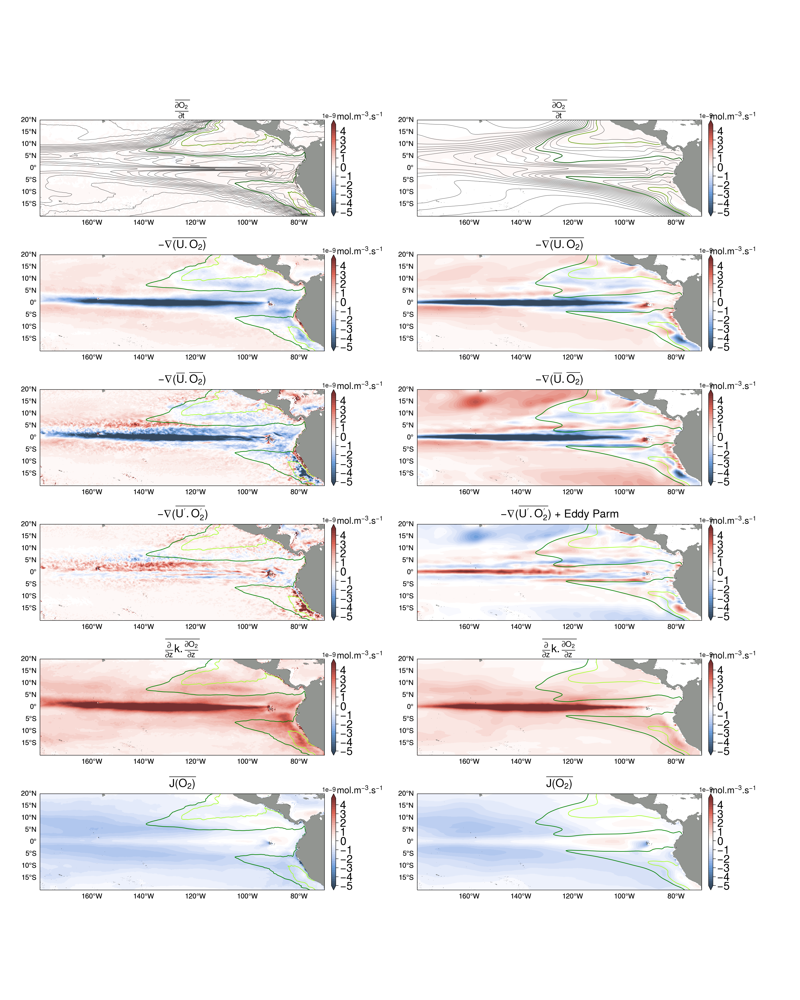

In [13]:
N,W=find_indices(dsh.TLONG,dsh.TLAT,360+Wi,Ni)
S,E=find_indices(dsh.TLONG,dsh.TLAT,360+Ei,Si)

fig = plt.figure(figsize=(16,20),dpi=100)
fs=16; fsx=10
EE=-200.0; WW=-70.1; SS=-20.0; NN=20.1
coor=[EE,WW,SS,NN]; CL=215.0 # central longtiude 
lon_lab=np.concatenate([np.arange(EE,WW,20)])
lat_lab=np.arange(SS,NN,5)

clr_o2='NegPos'
om_clr='blue'
omz_clr='green'
odz_clr='lime'

VAR= [dsh.TEND_O2.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsh.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
      dsh.DIV.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsh.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
      dsh.DIVm.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsh.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
      dsh.DIVp.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsh.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
      dsh.VDIF.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsh.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
      dsh.J_O2.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsh.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),]

units=['   mol.m$^{-3}$.s$^{-1}$']
title=[r'$\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r'$-\nabla{\overline{(U.O_2)}}$ ',
     r'$-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r"$-\nabla{(\overline{U'.O_2'})}$",
#      r'$-\nabla_H{\overline{(U.O_2)}}$ ',
#      r'$\overline{\frac{\partial{w.O_2}}{\partial{z}}}$ ',
     r'$\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r'$\overline{J(O_2)}$ ']



clrs=[clr_o2]
lmax=5e-9
lmin=-lmax
lstp=lmax*0.5e-1

gs = fig.add_gridspec(nrows=6, ncols=2, left=0.05, right=0.95, wspace=0.1, hspace=0.4)
rng=[0,1,2,3,4,5]
r=[0,1,2,3,4,5]
c=[0,0,0,0,0,0]

for i in tqdm(np.arange(0,6)):#len(VAR))):
    ax = fig.add_subplot(gs[r[i], c[i]] ,projection=ccrs.PlateCarree())
    ax = plot_cmap(ax,dsh.TLONG,dsh.TLAT, VAR[i],lmin, lmax, lstp,
                   clrs[0],units[0],title[i],coor,fs,fsx, lon_lab,lat_lab)
#     (dv.UVEL).isel(z_t=15).plot.contour(colors='black',linewidths=0.7,levels=np.arange(-150,150,50))
    ax.contour(dsh.TLONG,dsh.TLAT, dsh.O2.isel(z_t=15),colors=omz_clr,linewidths=0.9,levels=np.arange(60,60.1,5))    
    ax.contour(dsh.TLONG,dsh.TLAT, dsh.O2.isel(z_t=15),colors=odz_clr,linewidths=0.9,levels=np.arange(20,20.1,5)) 
    if i==0: 
        ax.contour(dsh.TLONG,dsh.TLAT, dsh.O2.isel(z_t=15),colors='black',linewidths=0.3,levels=np.arange(0,200.1,10)) 
    gl=ax.gridlines(draw_labels=True)
    gl.xlabel_style = {'size': fsx, 'color': 'black'}; gl.ylabel_style = {'size': fsx, 'color': 'black'}; 
    gl.xlabels_top = False; gl.ylabels_right= False; gl.xlines = False; gl.ylines = False
    gl.xlocator = mticker.FixedLocator(lon_lab); gl.ylocator = mticker.FixedLocator(lat_lab)
    gl.xformatter = LONGITUDE_FORMATTER ; gl.yformatter = LATITUDE_FORMATTER

    
    
N,W=find_indices(dsl.TLONG,dsl.TLAT,360+Wi,Ni)
S,E=find_indices(dsl.TLONG,dsl.TLAT,360+Ei,Si)

VAR= [dsl.TEND_O2.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsl.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
      dsl.DIV.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsl.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
      dsl.DIVm.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsl.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
      (dsl.DIVp.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsl.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3))+dsl.HDIF.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsl.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),  #+
      dsl.VDIF.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsl.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),
      dsl.J_O2.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*nmol_mol/(dsl.VOL.sel(z_t=slice(top*1e2,bot*1e2)).sum('z_t')*cm3_m3),]

units=['mol.m$^{-3}$.s$^{-1}$']
title=[r'$\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r'$-\nabla{\overline{(U.O_2)}}$ ',
     r'$-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r"$-\nabla{(\overline{U'.O_2'})}$ + Eddy Parm",
     r'$\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r'$\overline{J(O_2)}$ ']

rng=[0,1,2,3,4,5]
r=[0,1,2,3,4,5]
c=[1,1,1,1,1,1]

for i in tqdm(np.arange(0,6)):#len(VAR))):
    ax = fig.add_subplot(gs[r[i], c[i]] ,projection=ccrs.PlateCarree())
    ax = plot_cmap(ax,dsl.TLONG,dsl.TLAT, VAR[i].where(dsl.REGION_MASK==2),lmin, lmax, lstp,
                   clrs[0],units[0],title[i],coor,fs,fsx, lon_lab,lat_lab)
#     (dv.UVEL).isel(z_t=15).plot.contour(colors='black',linewidths=0.7,levels=np.arange(-150,150,50))
    ax.contour(dsl.TLONG,dsl.TLAT, dsl.O2.isel(z_t=15).where(dsl.REGION_MASK==2),colors=omz_clr,linewidths=0.9,levels=np.arange(60,60.1,5))    
    ax.contour(dsl.TLONG,dsl.TLAT, dsl.O2.isel(z_t=15).where(dsl.REGION_MASK==2),colors=odz_clr,linewidths=0.9,levels=np.arange(20,20.1,5)) 
    if i==0: 
        ax.contour(dsl.TLONG,dsl.TLAT, dsl.O2.isel(z_t=15).where(dsl.REGION_MASK==2),colors='black',linewidths=0.3,levels=np.arange(0,200.1,10)) 
    gl=ax.gridlines(draw_labels=True)
    gl.xlabel_style = {'size': fsx, 'color': 'black'}; gl.ylabel_style = {'size': fsx, 'color': 'black'}; 
    gl.xlabels_top = False; gl.ylabels_right= False; gl.xlines = False; gl.ylines = False
    gl.xlocator = mticker.FixedLocator(lon_lab); gl.ylocator = mticker.FixedLocator(lat_lab)
    gl.xformatter = LONGITUDE_FORMATTER ; gl.yformatter = LATITUDE_FORMATTER
fig.tight_layout

100%|██████████| 1/1 [00:02<00:00,  2.94s/it]


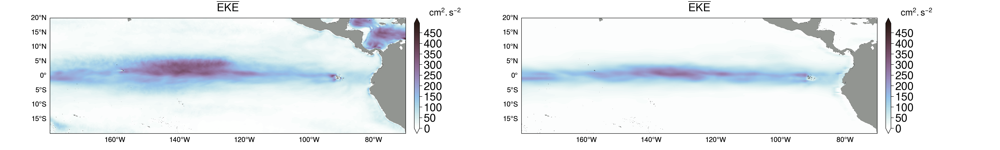

In [195]:
fig = plt.figure(figsize=(20,3),dpi=100)
fs=16; fsx=10
EE=-200.0; WW=-70.1; SS=-20.0; NN=20.1
coor=[EE,WW,SS,NN]; CL=215.0 # central longtiude 
lon_lab=np.concatenate([np.arange(EE,WW,20)])
lat_lab=np.arange(SS,NN,5)


clr_o2='NegPos'
om_clr='blue'
omz_clr='green'
odz_clr='lime'

VAR= [ekeh.__xarray_dataarray_variable__,]
units=[r'$cm^2.s^{-2}$']
title=[r'$\overline{EKE}$']

clrs=['glacial']
lmax=5e2
lmin=0
lstp=lmax*1e-2

gs = fig.add_gridspec(nrows=1, ncols=2, left=0.05, right=0.95, wspace=0.1, hspace=0.4)
rng=[0,1,2,3,4,5]
r=[0,1,2,3,4,5]
c=[0,0,0,0,0,0]

for i in tqdm(np.arange(0,1)):#len(VAR))):
    ax = fig.add_subplot(gs[r[i], c[i]] ,projection=ccrs.PlateCarree())
    ax = plot_cmap(ax,dg.TLONG,dg.TLAT, VAR[i],lmin, lmax, lstp,
                   clrs[0],units[0],title[i],coor,fs,fsx, lon_lab,lat_lab)
    gl=ax.gridlines(draw_labels=True)
    gl.xlabel_style = {'size': fsx, 'color': 'black'}; gl.ylabel_style = {'size': fsx, 'color': 'black'}; 
    gl.xlabels_top = False; gl.ylabels_right= False; gl.xlines = False; gl.ylines = False
    gl.xlocator = mticker.FixedLocator(lon_lab); gl.ylocator = mticker.FixedLocator(lat_lab)
    gl.xformatter = LONGITUDE_FORMATTER ; gl.yformatter = LATITUDE_FORMATTER
    

VAR= [ekel.__xarray_dataarray_variable__,]
units=[r'$cm^2.s^{-2}$']
title=[r'$\overline{EKE}$']

rng=[0,1,2,3,4,5]
r=[0,1,2,3,4,5]
c=[1,1,0,0,0,0]

for i in tqdm(np.arange(0,1)):#len(VAR))):
    ax = fig.add_subplot(gs[r[i], c[i]] ,projection=ccrs.PlateCarree())
    ax = plot_cmap(ax,dul.TLONG,dul.TLAT, VAR[i],lmin, lmax, lstp,
                   clrs[0],units[0],title[i],coor,fs,fsx, lon_lab,lat_lab)
    gl=ax.gridlines(draw_labels=True)
    gl.xlabel_style = {'size': fsx, 'color': 'black'}; gl.ylabel_style = {'size': fsx, 'color': 'black'}; 
    gl.xlabels_top = False; gl.ylabels_right= False; gl.xlines = False; gl.ylines = False
    gl.xlocator = mticker.FixedLocator(lon_lab); gl.ylocator = mticker.FixedLocator(lat_lab)
    gl.xformatter = LONGITUDE_FORMATTER ; gl.yformatter = LATITUDE_FORMATTER
        

In [14]:
savefig(fig,"Final_Figures/O2_budget_map_Comparison")

100%|██████████| 7/7 [00:04<00:00,  1.54it/s]


<bound method Figure.tight_layout of <Figure size 1500x2000 with 28 Axes>>

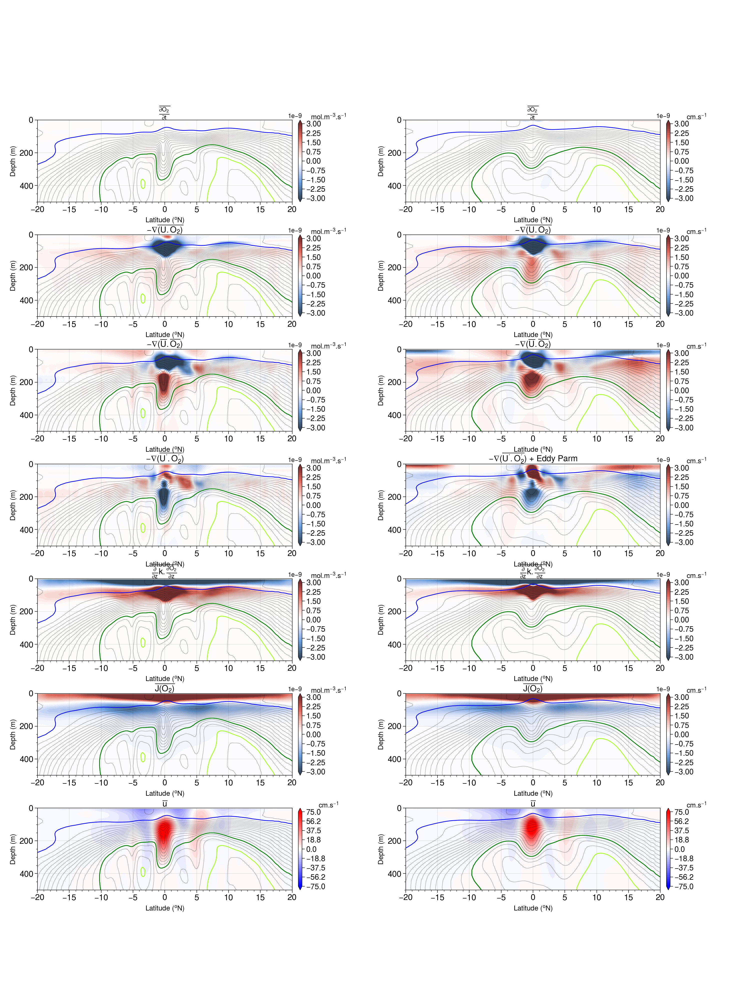

In [91]:
N,W=find_indices(dsh.TLONG,dsh.TLAT,360+Wi,Ni)
S,E=find_indices(dsh.TLONG,dsh.TLAT,360+Ei,Si)

fig = plt.figure(figsize=(15,20),dpi=100,)
gs = fig.add_gridspec(nrows=7, ncols=2, left=0.05, right=0.95, wspace=0.2, hspace=0.4)

fs=12; fsx=5; 
SS=-20; NN=20
tops=0. ; bots=500.; 
coords=[[bots,tops],[SS,NN]]

om_clr='blue'

var= [dsh.TEND_O2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.DIV.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.DIVm.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.DIVp.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.VDIF.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsh.J_O2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      duh.UVEL.isel(nlon=slice(W,E)).mean('nlon').squeeze(),]

cntf= True ; cnt= False 
units=['mol.m$^{-3}$.s$^{-1}$']
title=[r'$\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r'$-\nabla{\overline{(U.O_2)}}$ ',
     r'$-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r"$-\nabla{(\overline{U'.O_2'})}$",
     r'$\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r'$\overline{J(O_2)}$ ',
     r'$\overline{u}$ ', ]
clr=[clr_o2]
lw=0.5; alp=1;cb_on=True

lo = -3e-9; hi = -lo; hi2 = -lo; dsc = -lo*0.5e-1
y=dsh.TLAT[:,E]
z= dsh.z_t*1e-2

j=[0,0,0,0,0,0,0]; i=[0,1,2,3,4,5,6]
for k in tqdm(np.arange(0,7)):#len(VAR))):
    ax = fig.add_subplot(gs[i[k],j[k]])
    if k>5: clr=['bwr']; units=['cm.s$^{-1}$']; lo = -.75e2; hi = -lo; hi2 = -lo; dsc = -lo*0.5e-1        
    
    cax= plot_depth_section(ax,y,z,var[k],cntf,np.arange(lo, hi+dsc, dsc),
                            clr[0],units[0],title[k],coords,fs,fsx,lw,alp,cb_on,'lon')
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),colors='black', alpha=0.6,linewidths=0.3, levels = np.arange(0,300.1,10))
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),
                     colors=om_clr, alpha=1, linewidths=1, levels = np.arange(200,200.1,0.1))
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),
                     colors=omz_clr, alpha=1, linewidths=1, levels = np.arange(60,60.1,0.1))
    pch= cax.contour(y, z,dsh.O2.isel(nlon=slice(W,E)).mean('nlon'),
                     colors=odz_clr, alpha=1, linewidths=1, levels = np.arange(20,20.1,0.1))

N,W=find_indices(dsl.TLONG,dsl.TLAT,360+Wi,Ni)
S,E=find_indices(dsl.TLONG,dsl.TLAT,360+Ei,Si)

var= [dsl.TEND_O2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsl.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3), #dsl.DIV.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsl.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3)+dsl.HDIF.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsl.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3)+dsl.VDIF.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsl.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3)+dsl.J_O2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsl.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsl.DIV.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsl.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsl.DIVm.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsl.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsl.DIVp.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsl.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3)+dsl.HDIF.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsl.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3), #
      dsl.VDIF.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsl.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dsl.J_O2.isel(nlon=slice(W,E)).sum('nlon')*nmol_mol/(dsl.VOL.isel(nlon=slice(W,E)).sum('nlon')*cm3_m3),
      dul.UVEL.isel(nlon=slice(W,E)).mean('nlon').squeeze(),]

title=[r'$\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r'$-\nabla{\overline{(U.O_2)}}$ ',
     r'$-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r"$-\nabla{(\overline{U'.O_2'})}$ + Eddy Parm",
     r'$\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r'$\overline{J(O_2)}$ ',
     r'$\overline{u}$ ', ]
clr=[clr_o2]
lo = -3e-9; hi = -lo; hi2 = -lo; dsc = -lo*0.5e-1
y=dsl.TLAT[:,E]
z= dsl.z_t*1e-2

j=[1,1,1,1,1,1,1]; i=[0,1,2,3,4,5,6]

for k in tqdm(np.arange(0,7)):#len(VAR))):
    ax = fig.add_subplot(gs[i[k],j[k]])
    if k>5: clr=['bwr']; units=['cm.s$^{-1}$']; lo = -.75e2; hi = -lo; hi2 = -lo; dsc = -lo*0.5e-1        
    
    cax= plot_depth_section(ax,y,z,var[k],cntf,np.arange(lo, hi+dsc, dsc),
                            clr[0],units[0],title[k],coords,fs,fsx,lw,alp,cb_on,'lon')
    pch= cax.contour(y, z,dsl.O2.isel(nlon=slice(W,E)).mean('nlon'),colors='black', alpha=0.6,linewidths=0.3, levels = np.arange(0,300.1,10))
    pch= cax.contour(y, z,dsl.O2.isel(nlon=slice(W,E)).mean('nlon'),colors=om_clr, alpha=1, linewidths=1, levels = np.arange(200,200.1,0.1))
    pch= cax.contour(y, z,dsl.O2.isel(nlon=slice(W,E)).mean('nlon'),colors=omz_clr, alpha=1, linewidths=1, levels = np.arange(60,60.1,0.1))
    pch= cax.contour(y, z,dsl.O2.isel(nlon=slice(W,E)).mean('nlon'),colors=odz_clr, alpha=1, linewidths=1, levels = np.arange(20,20.1,0.1))

fig.tight_layout

In [17]:
savefig(fig,"Final_Figures/O2_budget_Meridional_COmparison")

100%|██████████| 6/6 [00:04<00:00,  1.40it/s]


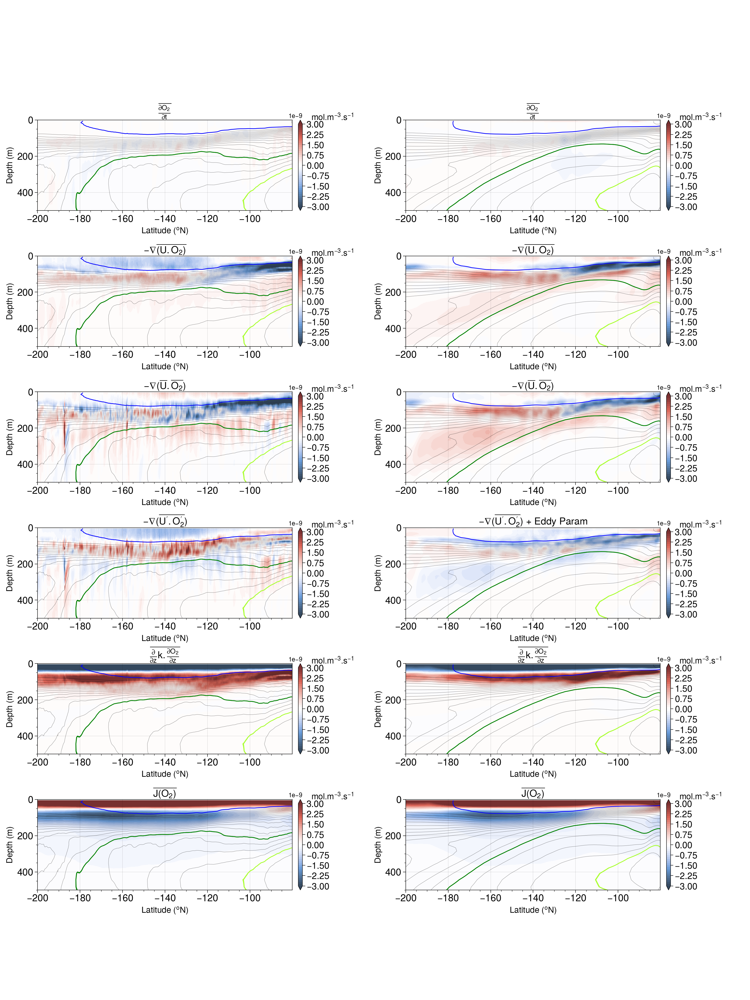

In [27]:
N,W=find_indices(dsh.TLONG,dsh.TLAT,360+Wi,Ni)
S,E=find_indices(dsh.TLONG,dsh.TLAT,360+Ei,Si)

fig = plt.figure(figsize=(15,20),dpi=100,)
gs = fig.add_gridspec(nrows=6, ncols=2, left=0.05, right=0.95, wspace=0.2, hspace=0.5)

fs=14; fsx=5; 
SS=-15; NN=15
EE=-200.0; WW=-80.1;
tops=0. ; bots=500.; 
coords=[[bots,tops],[EE,WW]]

var= [dsh.TEND_O2.isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsh.VOL.isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),
      dsh.DIV.isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsh.VOL.isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),
      dsh.DIVm.isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsh.VOL.isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),
      dsh.DIVp.isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsh.VOL.isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),
      dsh.VDIF.isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsh.VOL.isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),
      dsh.J_O2.isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsh.VOL.isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),]


cntf= True ; cnt= False 
units=['mol.m$^{-3}$.s$^{-1}$']
title=[r'$\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r'$-\nabla{\overline{(U.O_2)}}$ ',
     r'$-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r"$-\nabla{(\overline{U'.O_2'})}$",
     r'$\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r'$\overline{J(O_2)}$ ']



clr=[clr_o2]
lw=0.5; alp=0.5;cb_on=True

lo = -3e-9; hi = -lo; hi2 = -lo; dsc = -lo*0.5e-1
y=dsh.TLONG[N,:]-360
z= dsh.z_t*1e-2

j=[0,0,0,0,0,0]; i=[0,1,2,3,4,5]

for k in tqdm(np.arange(0,6)):#len(VAR))):
    ax = fig.add_subplot(gs[i[k],j[k]])
    cax= plot_depth_section(ax,y,z,var[k],cntf,np.arange(lo, hi+dsc, dsc),
                            clr[0],units[0],title[k],coords,fs,fsx,lw,alp,cb_on,'lon')
    pch= cax.contour(y, z,dsh.O2.isel(nlat=slice(S,N)).mean('nlat'),
                     colors='black', alpha=0.6,linewidths=0.3, levels = np.arange(0,300.1,10))
    pch= cax.contour(y, z,dsh.O2.isel(nlat=slice(S,N)).mean('nlat'),
                     colors=om_clr, alpha=1, linewidths=1, levels = np.arange(200,200.1,0.1))
    pch= cax.contour(y, z,dsh.O2.isel(nlat=slice(S,N)).mean('nlat'),
                     colors=omz_clr, alpha=1, linewidths=1, levels = np.arange(60,60.1,0.1))
    pch= cax.contour(y, z,dsh.O2.isel(nlat=slice(S,N)).mean('nlat'),
                     colors=odz_clr, alpha=1, linewidths=1, levels = np.arange(20,20.1,0.1))


N,W=find_indices(dsl.TLONG,dsl.TLAT,360+Wi,Ni)
S,E=find_indices(dsl.TLONG,dsl.TLAT,360+Ei,Si)

var= [dsl.TEND_O2.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsl.VOL.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),
      dsl.DIV.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsl.VOL.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),
      dsl.DIVm.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsl.VOL.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),
      dsl.DIVp.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsl.VOL.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).sum('nlat')*cm3_m3)+dsl.HDIF.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsl.VOL.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),
      dsl.VDIF.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsl.VOL.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),
      dsl.J_O2.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).sum('nlat')*nmol_mol/(dsl.VOL.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).sum('nlat')*cm3_m3),]

title=[r'$\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r'$-\nabla{\overline{(U.O_2)}}$ ',
     r'$-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r"$-\nabla{(\overline{U'.O_2'})}$ + Eddy Param",
     r'$\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r'$\overline{J(O_2)}$ ']

y=dsl.TLONG[N,:]-360
z= dsl.z_t*1e-2

j=[1,1,1,1,1,1]; i=[0,1,2,3,4,5]

for k in tqdm(np.arange(0,6)):#len(VAR))):
    ax = fig.add_subplot(gs[i[k],j[k]])
    cax= plot_depth_section(ax,y,z,var[k],cntf,np.arange(lo, hi+dsc, dsc),
                            clr[0],units[0],title[k],coords,fs,fsx,lw,alp,cb_on,'lon')
    pch= cax.contour(y, z,dsl.O2.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).mean('nlat'),
                     colors='black', alpha=0.6,linewidths=0.3, levels = np.arange(0,300.1,10))
    pch= cax.contour(y, z,dsl.O2.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).mean('nlat'),
                     colors=om_clr, alpha=1, linewidths=1, levels = np.arange(200,200.1,0.1))
    pch= cax.contour(y, z,dsl.O2.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).mean('nlat'),
                     colors=omz_clr, alpha=1, linewidths=1, levels = np.arange(60,60.1,0.1))
    pch= cax.contour(y, z,dsl.O2.where(dsl.REGION_MASK==2).isel(nlat=slice(S,N)).mean('nlat'),
                     colors=odz_clr, alpha=1, linewidths=1, levels = np.arange(20,20.1,0.1))

    
fig.tight_layout()

In [28]:
savefig(fig,"Final_Figures/O2_budget_zonal_Comparison")

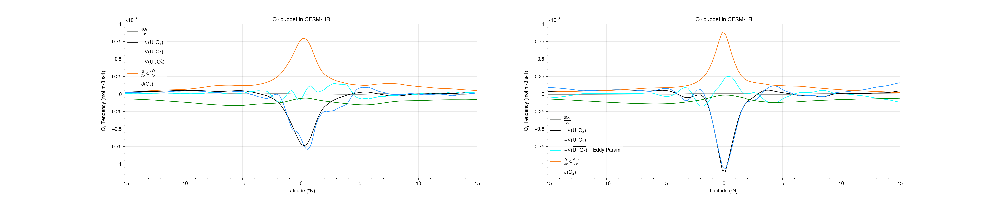

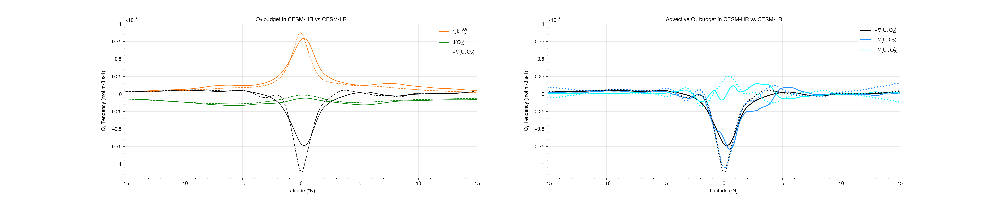

In [29]:
N,W=find_indices(dsh.TLONG,dsh.TLAT,360+Wi,Ni)
S,E=find_indices(dsh.TLONG,dsh.TLAT,360+Ei,Si)
# volume integral
dshb=dsh.isel(nlon=slice(W,E)).sum('nlon').sel(z_t=slice(top*1e2,bot*1e2)).sum(dim='z_t').compute()
VOL_hr=(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon').sel(z_t=slice(top*1e2,bot*1e2)).sum(dim='z_t')*cm3_m3)
dshb

N,W=find_indices(dsl.TLONG,dsl.TLAT,360+Wi,Ni)
S,E=find_indices(dsl.TLONG,dsl.TLAT,360+Ei,Si)
# volume integral
dslb=dsl.isel(nlon=slice(W,E)).sum('nlon').sel(z_t=slice(top*1e2,bot*1e2)).sum(dim='z_t').compute()
VOL_lr=(dsl.VOL.isel(nlon=slice(W,E)).sum('nlon').sel(z_t=slice(top*1e2,bot*1e2)).sum(dim='z_t')*cm3_m3)
dslb

VARS=[dshb.TEND_O2,
      dshb.DIV,
      dshb.DIVm,
      dshb.DIVp,
      dshb.VDIF,
      dshb.J_O2,]
title=[r' $\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r' $-\nabla{\overline{(U.O_2)}}$ ',
     r' $-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r" $-\nabla{(\overline{U'.O_2'})}$",
     r' $\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r' $\overline{J(O_2)}$ ',]

clr=['grey','black','dodgerblue','cyan','orange','green']

fig, ax = plt.subplots(1,2, figsize=(25,5), sharey=False)
i=0
for VAR in VARS:
    ax[0].plot(dsh.TLAT[:,0],VAR * nmol_mol/VOL_hr,
               label=str(title[i]), color=clr[i],lw=1)
    i+=1
ax[0].legend()
ax[0].set_title('O$_2$ budget in CESM-HR')# integrated over '+str(abs(Wi))+'W-'+str(abs(Ei))+'W '+str(top)+'-'+str(bot)+'m')
ax[0].set_ylabel('O$_2$ Tendency (mol.m-3.s-1)')
ax[0].set_xlabel('Latitude (ºN)')
ax[0].set_xlim(-15,15)
ax[0].set_ylim(-1.2e-8,1.0e-8)

VARS=[dslb.TEND_O2,
      dslb.DIV,
      dslb.DIVm,
      dslb.DIVp+dslb.HDIF,
      dslb.VDIF,
      dslb.J_O2,]
title=[r' $\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r' $-\nabla{\overline{(U.O_2)}}$ ',
     r' $-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r" $-\nabla{(\overline{U'.O_2'})}$ + Eddy Param",
     r' $\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r' $\overline{J(O_2)}$ ',]

clr=['grey','black','dodgerblue','cyan','orange','green']

i=0
for VAR in VARS:
    ax[1].plot(dsl.TLAT[:,0],VAR* nmol_mol/VOL_lr,
               label=str(title[i]), color=clr[i],lw=1)
    i+=1
ax[1].legend()
ax[1].set_title('O$_2$ budget in CESM-LR')# integrated over '+str(abs(Wi))+'W-'+str(abs(Ei))+'W '+str(top)+'-'+str(bot)+'m')
ax[1].set_ylabel('O$_2$ Tendency (mol.m-3.s-1)')
ax[1].set_xlabel('Latitude (ºN)')
ax[1].set_xlim(-15,15)
ax[1].set_ylim(-1.2e-8,1.0e-8)


# Plot main budget terms for both resolutions 

VARS=[dshb.TEND_O2,
      dshb.DIV,
      dshb.DIVm,
      dshb.DIVp,
      dshb.VDIF,
      dshb.J_O2,
     dshb.DIV,]
title=[r' $\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r' $-\nabla{\overline{(U.O_2)}}$ ',
     r' $-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r" $-\nabla{(\overline{U'.O_2'})}$",
     r' $\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r' $\overline{J(O_2)}$ ',
           r' $-\nabla{\overline{(U.O_2)}}$ ',]

clr=['grey','black','dodgerblue','cyan','orange','green','black']

fig, ax = plt.subplots(1,2, figsize=(25,5), sharey=False)
i=4
for VAR in VARS[4:7]:
    ax[0].plot(dsh.TLAT[:,0],VAR * nmol_mol/VOL_hr,
               label=str(title[i]), color=clr[i],lw=1)
    i+=1
ax[0].legend()
ax[0].set_title('O$_2$ budget in CESM-HR vs CESM-LR')# integrated over '+str(abs(Wi))+'W-'+str(abs(Ei))+'W '+str(top)+'-'+str(bot)+'m')
ax[0].set_ylabel('O$_2$ Tendency (mol.m-3.s-1)')
ax[0].set_xlabel('Latitude (ºN)')
ax[0].set_xlim(-15,15)
ax[0].set_ylim(-1.2e-8,1.0e-8)

VARS=[dslb.TEND_O2,
      dslb.DIV,
      dslb.DIVm,
      dslb.DIVp+dslb.HDIF,
      dslb.VDIF,
      dslb.J_O2,
           dslb.DIV,]
title=[r' $\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r' $-\nabla{\overline{(U.O_2)}}$ ',
     r' $-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r" $-\nabla{(\overline{U'.O_2'})}$ + Eddy Param",
     r' $\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r' $\overline{J(O_2)}$ ',
           r' $-\nabla{\overline{(U.O_2)}}$ ',]

clr=['grey','black','dodgerblue','cyan','orange','green','black']

i=4
for VAR in VARS[4:7]:
    ax[0].plot(dsl.TLAT[:,0],VAR* nmol_mol/VOL_lr,
               label=str(title[i]), color=clr[i],lw=1,ls='--')
    i+=1    
    

# Plot Advective budget terms for both resolutions     
VARS=[dshb.TEND_O2,
      dshb.DIV,
      dshb.DIVm,
      dshb.DIVp,
      dshb.VDIF,
      dshb.J_O2,]
title=[r' $\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r' $-\nabla{\overline{(U.O_2)}}$ ',
     r' $-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r" $-\nabla{(\overline{U'.O_2'})}$",
     r' $\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r' $\overline{J(O_2)}$ ',]

clr=['grey','black','dodgerblue','cyan','orange','green']

i=1
for VAR in VARS[1:4]:
    ax[1].plot(dsh.TLAT[:,0],VAR * nmol_mol/VOL_hr,
               label=str(title[i]), color=clr[i],lw=1.5)
    i+=1
ax[1].legend()
ax[1].set_title('Advective O$_2$ budget in CESM-HR vs CESM-LR')# integrated over '+str(abs(Wi))+'W-'+str(abs(Ei))+'W '+str(top)+'-'+str(bot)+'m')
ax[1].set_ylabel('O$_2$ Tendency (mol.m-3.s-1)')
ax[1].set_xlabel('Latitude (ºN)')
ax[1].set_xlim(-15,15)
ax[1].set_ylim(-1.2e-8,1.0e-8)

VARS=[dslb.TEND_O2,
      dslb.DIV,
      dslb.DIVm,
      dslb.DIVp+dslb.HDIF,
      dslb.VDIF,
      dslb.J_O2,]
title=[r' $\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r' $-\nabla{\overline{(U.O_2)}}$ ',
     r' $-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r" $-\nabla{(\overline{U'.O_2'})}$ + Eddy Param",
     r' $\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r' $\overline{J(O_2)}$ ',]

clr=['grey','black','dodgerblue','cyan','orange','green']

i=1
for VAR in VARS[1:4]:
    ax[1].plot(dsl.TLAT[:,0],VAR* nmol_mol/VOL_lr,
               label=str(title[i]), color=clr[i],lw=2,ls=':')
    i+=1
    
    

In [30]:
N,W=find_indices(dsh.TLONG,dsh.TLAT,360+Wi,Ni)
S,E=find_indices(dsh.TLONG,dsh.TLAT,360+Ei,Si)
# volume integral
dshb=(dsh.isel(nlon=slice(W,E)).sum('nlon').isel(nlat=slice(S,N)).sum('nlat').sel(z_t=slice(top*1e2,bot*1e2)).sum(dim='z_t')).compute()
dshb
VOL_hr=(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon').isel(nlat=slice(S,N)).sum('nlat').sel(z_t=slice(top*1e2,bot*1e2)).sum(dim='z_t')*cm3_m3).compute()



N,W=find_indices(dsl.TLONG,dsl.TLAT,360+Wi,Ni)
S,E=find_indices(dsl.TLONG,dsl.TLAT,360+Ei,Si)
# volume integral
dslb=(dsl.isel(nlon=slice(W,E)).sum('nlon').isel(nlat=slice(S,N)).sum('nlat').sel(z_t=slice(top*1e2,bot*1e2)).sum(dim='z_t')).compute()
dslb
VOL_lr=(dsl.VOL.isel(nlon=slice(W,E)).sum('nlon').isel(nlat=slice(S,N)).sum('nlat').sel(z_t=slice(top*1e2,bot*1e2)).sum(dim='z_t')*cm3_m3).compute()

Text(5.5, 400000.0, 'CESM-LR')

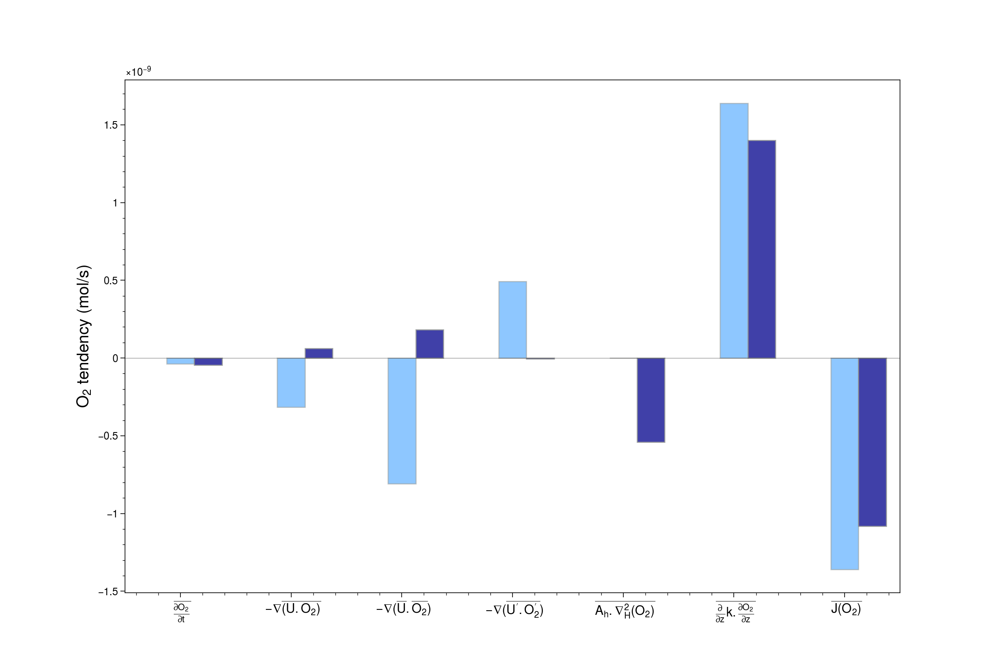

In [31]:
fig = plt.figure(figsize=(12,8),dpi=100,)
VARS=[dshb.TEND_O2,
      dshb.DIV,
      dshb.DIVm,
      dshb.DIVp,
      dshb.HDIF,
      dshb.VDIF,
      dshb.J_O2,]
title=[r' $\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r' $-\nabla{\overline{(U.O_2)}}$ ',
     r' $-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r" $-\nabla{(\overline{U'.O_2'})}$",
#      r' $\overline{A_h.\nabla_H^2{({O_2})}}$',
     r' $\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r' $\overline{J(O_2)}$ ',]

x=np.arange(0,len(VARS))
plt.bar(x,[V * nmol_mol/VOL_hr for V in VARS],width=0.25,align='center',color='dodgerblue',alpha=0.5,lw=1.0,edgecolor='grey')

# plt.xticks(x, title,size=11)
# plt.hlines(0,-0.5,6.5,lw=0.2,color='k')
# plt.grid(b=None)
# plt.xlim(-0.5,6.5)
# plt.ylim(-7e5,7e5)
# plt.ylabel(r"O$_2$ tendency (mol/s)",size=14)
# plt.text(6.5,6.0e5,'CESM-HR',color="dodgerblue")
# plt.text(6.5,5.8e5,'CESM-LR',color="darkblue")


VARS=[dslb.DIVm+dslb.DIVp+dslb.HDIF+dslb.VDIF+dslb.J_O2, #dslb.TEND_O2,
      dslb.DIV,
      dslb.DIVm,
      dslb.DIVp+dslb.HDIFB_O2,
      dslb.HDIF-dslb.HDIFB_O2,
      dslb.VDIF,
      dslb.J_O2,]
title=[r' $\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r' $-\nabla{\overline{(U.O_2)}}$ ',
     r' $-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r" $-\nabla{(\overline{U'.O_2'})}$",
     r' $\overline{A_h.\nabla_H^2{({O_2})}}$',
     r' $\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r' $\overline{J(O_2)}$ ',]
plt.bar(x+0.25,[V * nmol_mol/VOL_lr for V in VARS],width=0.25,align='center',color='darkblue',alpha=0.75,lw=1.0,edgecolor='grey')
plt.xticks(x, title,size=11)
plt.hlines(0,-0.5,6.5,lw=0.2,color='k')
plt.grid(b=None)
plt.xlim(-0.5,6.5)
# plt.ylim(-6e5,6e5)
plt.ylabel(r"O$_2$ tendency (mol/s)",size=14)
plt.text(5.5,5.0e5,'CESM-HR',color="dodgerblue",size=18)
plt.text(5.5,4.0e5,'CESM-LR',color="darkblue",size=18)

In [32]:
N,W=find_indices(dsh.TLONG,dsh.TLAT,360+Wi,Ni)
S,E=find_indices(dsh.TLONG,dsh.TLAT,360+Ei,Si)
# volume integral
dshb=(dsh.isel(nlon=slice(W,E)).sum('nlon').isel(nlat=slice(S,N)).sum('nlat')).compute()
dshb
VOL_hr=(dsh.VOL.isel(nlon=slice(W,E)).sum('nlon').isel(nlat=slice(S,N)).sum('nlat')*cm3_m3).compute()


N,W=find_indices(dsl.TLONG,dsl.TLAT,360+Wi,Ni)
S,E=find_indices(dsl.TLONG,dsl.TLAT,360+Ei,Si)
# volume integral
dslb=(dsl.isel(nlon=slice(W,E)).sum('nlon').isel(nlat=slice(S,N)).sum('nlat')).compute()
dslb
VOL_lr=(dsl.VOL.isel(nlon=slice(W,E)).sum('nlon').isel(nlat=slice(S,N)).sum('nlat')*cm3_m3).compute()

(50000.0, 5000.0)

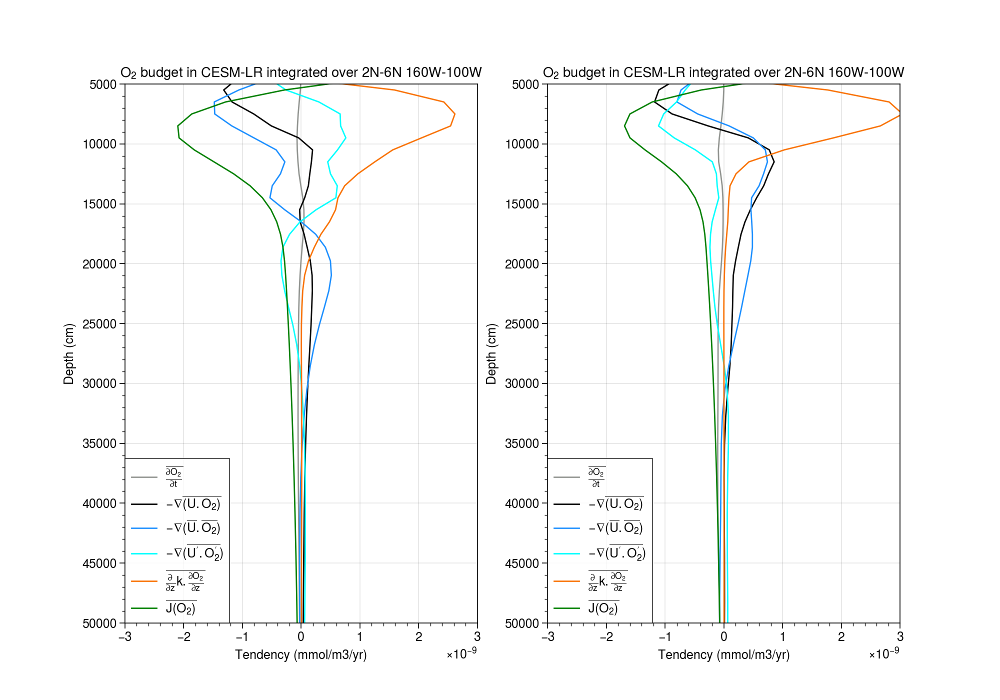

In [33]:
VARS=[dshb.TEND_O2,
      dshb.DIV,
      dshb.DIVm,
      dshb.DIVp,
      dshb.VDIF,
      dshb.J_O2,]
VARC=[r' $\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r' $-\nabla{\overline{(U.O_2)}}$ ',
     r' $-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r" $-\nabla{(\overline{U'.O_2'})}$",
     r' $\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r' $\overline{J(O_2)}$ ',]

clr=['grey','black','dodgerblue','cyan','orange','green']
dpt=500e2
conv_mmol_m3_mo=nmol_mol


i=0
fig, ax = plt.subplots(1,2, figsize=(10,7), sharey=False)
for VAR in VARS:
    (VAR*nmol_mol/VOL_hr).plot(y="z_t", ylim=(dpt, 0), label=str(VARC[i]), ax=ax[0],color=clr[i],lw=1)
    i+=1
ax[0].legend()
ax[0].set_title('O$_2$ budget in CESM-LR integrated over '+str(Si)+'N-'+str(Ni)+'N '+str(abs(Wi))+'W-'+str(abs(Ei))+'W ')
ax[0].set_ylabel('Depth (cm)')
ax[0].set_xlabel('Tendency (mmol/m3/yr)')
ax[0].set_xlim(-3e-9,3e-9)
ax[0].set_ylim(500e2,50e2)

VARS=[dslb.TEND_O2,
      dslb.DIV,
      dslb.DIVm,
      dslb.DIVp+dslb.HDIF,
      dslb.VDIF,
      dslb.J_O2,]
VARC=[r' $\overline{\frac{\partial{O_2}}{\partial{t}}}$ ', 
     r' $-\nabla{\overline{(U.O_2)}}$ ',
     r' $-\nabla{(\overline{U}.\overline{O_2})}$ ',
     r" $-\nabla{(\overline{U'.O_2'})}$",
     r' $\overline{\frac{\partial{}}{\partial{z}}k.\frac{\partial{O_2}}{\partial{z}}}$ ',
     r' $\overline{J(O_2)}$ ',]

i=0
for VAR in VARS:
    (VAR*nmol_mol/VOL_lr).plot(y="z_t", ylim=(dpt, 0), label=str(VARC[i]), ax=ax[1],color=clr[i],lw=1)
    i+=1
ax[1].legend()
ax[1].set_title('O$_2$ budget in CESM-LR integrated over '+str(Si)+'N-'+str(Ni)+'N '+str(abs(Wi))+'W-'+str(abs(Ei))+'W ')
ax[1].set_ylabel('Depth (cm)')
ax[1].set_xlabel('Tendency (mmol/m3/yr)')
ax[1].set_xlim(-3e-9,3e-9)
ax[1].set_ylim(500e2,50e2)

In [4]:
path = f'/glade/scratch/yeddebba/Mesoscale/HR/TPAC/UVVEL.15m.nc'
dssh = xr.open_mfdataset(path)#.isel(nlon=np.arange(400,1699),nlat=np.arange(100,550))
varname = ['ULAT','ULONG','z_t','UVEL','VVEL','time'] 
dssh=dssh.drop([v for v in dssh.variables if v not in varname])  
dssh=dssh.chunk({"time":73})
dssh

<xarray.Dataset>
Dimensions:  (nlat: 631, nlon: 1701, time: 365)
Coordinates:
    ULAT     (nlat, nlon) float64 dask.array<chunksize=(631, 1701), meta=np.ndarray>
    ULONG    (nlat, nlon) float64 dask.array<chunksize=(631, 1701), meta=np.ndarray>
    z_t      float32 ...
  * time     (time) object 0001-01-06 00:00:00 ... 0006-01-01 00:00:00
Dimensions without coordinates: nlat, nlon
Data variables:
    UVEL     (time, nlat, nlon) float32 dask.array<chunksize=(73, 631, 1701), meta=np.ndarray>
    VVEL     (time, nlat, nlon) float32 dask.array<chunksize=(73, 631, 1701), meta=np.ndarray>
Attributes: (12/13)
    title:           g.e11.G.T62_t12.eco.006
    history:         Wed May 20 17:48:20 2020: ncrcat -O -v UVEL -d nlon,2300...
    Conventions:     CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-curr...
    contents:        Diagnostic and Prognostic Variables
    source:          CCSM POP2, the CCSM Ocean Component
    revision:        $Id: tavg.F90 41939 2012-11-14 16:37:23Z mlevy@ucar.edu $
    ...              ...
    start_time:      This dataset was created on 2014-01-23 at 23:04:17.8
    cell_methods:    cell_methods = time: mean ==> the variable values are av...
    nsteps_total:    3781
    tavg_sum:        410399.9999999738
    tavg_sum_qflux:  410400.00000000006
    NCO:             netCDF Operators version 4.7.9 (Homepage = http://nco.sf...

### Load grid file

In [169]:
dg = xr.open_dataset('/glade/scratch/yeddebba/Mesoscale/HR/TPAC/POP_GRID_F.nc')
dg=dg.isel(z_w=np.arange(0,41),z_t=np.arange(0,41),z_w_top=np.arange(0,41)).isel(nlon=np.arange(400,1699),nlat=np.arange(100,550))

### Calculate Eddy Kinetic Energy using residual from from 90 days running mean:

In [5]:
def EKE(U,V,Um,Vm):
    U_p=(U-Um)
    V_p=(V-Vm)
    eke=((U_p**2+V_p**2)/2)    
    
    return eke

In [6]:
ndays=90; ndt=int(ndays/5)
Urm=dssh.UVEL.rolling(time=ndt,center=True).mean().compute()
Vrm=dssh.VVEL.rolling(time=ndt,center=True).mean().compute()

In [7]:
eke=EKE(dssh.UVEL,dssh.VVEL,Urm,Vrm)

In [8]:
eke.to_netcdf('/glade/scratch/yeddebba/Mesoscale/HR/TPAC/EKE.nc')

In [10]:
EKE=xr.open_mfdataset('/glade/scratch/yeddebba/Mesoscale/HR/TPAC/EKE.nc')

In [13]:
EKE.mean('time').to_netcdf('/glade/scratch/yeddebba/Mesoscale/HR/CLM/EKE.CLM.nc')

In [125]:
path1 = f'/glade/scratch/yeddebba/Mesoscale/LR/3D/VVEL/VVEL.nc'
path2 = f'/glade/scratch/yeddebba/Mesoscale/LR/3D/UVEL/UVEL.nc'
dssh = xr.open_mfdataset({path1,path2}).isel(z_t=1).squeeze()
varname=['ULAT','ULONG','z_t','UVEL','VVEL','time'] 
dssh=dssh.drop([v for v in dssh.variables if v not in varname])  
# dssh=dssh.chunk({"time":73})
dssh

dg = xr.open_dataset('/glade/work/yeddebba/grids/pop-grid.nc')#.isel(nlat=np.arange(lat1,lat2),nlon=np.arange(lon1,lon2)).sel(z_t=slice(top*1e2,bot*1e2))
# dg0=dg0.isel(z_w=np.arange(0,41),z_t=np.arange(0,41),z_w_top=np.arange(0,41)) 
dg

### Calculate mean Eddy Kinetic Energy using residual from 90 days running mean:  


In [132]:
ndays=90; ndt=int(ndays/5)
Urm=dssh.UVEL.rolling(time=ndt,center=True).mean().compute()
Vrm=dssh.VVEL.rolling(time=ndt,center=True).mean().compute()

eke=EKE(dssh.UVEL,dssh.VVEL,Urm,Vrm)

In [134]:
eke.to_netcdf('/glade/scratch/yeddebba/Mesoscale/LR/EKE.15m.nc')

In [135]:
eke.mean('time').to_netcdf('/glade/scratch/yeddebba/Mesoscale/LR/CLM/EKE_15m.nc')